<a href="https://colab.research.google.com/github/gurpreetschohan/NBASentimentAnalysis/blob/main/Lebron_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analysis comparing NBA Fan sentiment towards LeBron James Before and After Breaking the All Time Scoring Record

Max Rodriguez (arodr395@calpoly.edu) Solomon Zhou (szhou11@calpoly.edu) Gurpreet Chohan (gchohan@calpoly.edu)


February 28th, 2023

Since LeBron James entered the NBA, there have been constant discussions on the greatest player of all time. LeBron James and Micheal Jordan have been the top 2 in this heated discussion. However, since LeBron James now holds the scoring title, we wanted to explore the change in sentiment towards him. Will fans finally acknowledge his greatness or continue hating?

This analysis is exploring the change in sentiment of LeBron James before and after he broke the all time scoring record in the NBA. We scraped data from NBA sub reddits and tweets from Twitter during the game in which the record was broken. 

Hypothesis: Basketball fans liked Lebron James more after he broke the all time scoring record.

Alternative: Basketball fans' perceptions of  Lebron James didn't change after he broke the record.

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

#**Libraries** 

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

In [ ]:
%%capture
pip install praw

In [ ]:
%%capture
pip install asyncpraw

In [ ]:
%%capture
!pip install matplotlib

In [ ]:
%%capture
!pip install wordcloud

In [ ]:
%%capture
pip install snscrape

In [ ]:
# This is the python API wrapper
import praw
import pandas as pd
import asyncio
import json
import time
import csv
import aiohttp
#asyncpraw works better in Google colab
import asyncpraw as praw
#For Sentiment analysis
from textblob import TextBlob
import nltk
nltk.download('stopwords')
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from IPython.display import Image


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [40]:
%%capture
!pip install nest_asyncio

import nest_asyncio
nest_asyncio.apply()

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

#**Sentiment Analysis** 

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

###**BEFORE** 

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

In [ ]:
CLIENT_ID = "_viV_n_Vrv8QGj6uZcpfew"
CLIENT_SECRET = "WuuFwVoPSVwrimc0rj7K_gdqoA7lkQ"
USER_AGENT = "MyAPI/0.0.1"
USERNAME = "Capital_Wonder6614"
PASSWORD = "Keke1289GG"
 
import nest_asyncio
nest_asyncio.apply()

players = [
    "Lebron James",
]


async def all_player(player, player_sentiment):
    async with aiohttp.ClientSession() as session:
        reddit = praw.Reddit(
            client_id=CLIENT_ID,
            client_secret=CLIENT_SECRET,
            user_agent=USER_AGENT,
            username=USERNAME,
            password=PASSWORD,
        )
        #Kinda works
        subreddit = await reddit.subreddit("nba") 
        params = {
              'q': f'{player} -subreddit:{player.replace(" ", "")}',
              'sort': 'relevance',
              'time_filter': 'year',
              'before': int(time.time()) - 200000,
              'after': int(time.time()) - 31536000
          }
        async for submission in subreddit.search(player + " -subreddit:" + player.replace(" ", ""), sort="comments", limit=500, params=params):
            title = submission.title
            blob = TextBlob(title)
            sentiment = blob.sentiment.polarity
            for person in players:
                if person in title:
                    player_sentiment[person] += sentiment

async def main():
    player_sentiment = {person: 0 for person in players}
    tasks = [asyncio.create_task(all_player(person, player_sentiment)) for person in players]
    await asyncio.gather(*tasks)

    sorted_teams = sorted(player_sentiment.items(), key=lambda x: x[1], reverse=True)
    for person, sentiment in sorted_teams:
        print(f"{person} - {sentiment:.2f}")     

if __name__ == '__main__':
    loop = asyncio.get_event_loop()
    loop.run_until_complete(main())

Lebron James - 1.24


----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

###**AFTER** 

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

In [ ]:
#For reddit API access/credentials
CLIENT_ID = "_viV_n_Vrv8QGj6uZcpfew"
CLIENT_SECRET = "WuuFwVoPSVwrimc0rj7K_gdqoA7lkQ"
USER_AGENT = "MyAPI/0.0.1"
USERNAME = "Capital_Wonder6614"
PASSWORD = "Keke1289GG"

#to help with sync problem in google collab
import nest_asyncio
nest_asyncio.apply()

#players list
players = [
    "Lebron James",
]

#takes 2 params player and sentiment
async def all_player(player, player_sentiment):
    #http request for the api
    async with aiohttp.ClientSession() as session:
        #praw library and access to api
        reddit = praw.Reddit(
            client_id=CLIENT_ID,
            client_secret=CLIENT_SECRET,
            user_agent=USER_AGENT,
            username=USERNAME,
            password=PASSWORD,
        )
        #gets actual subreddit
        subreddit = await reddit.subreddit("nba") 
        #looking through nba subreddit for posts containing the player name, will remove any subreddits that are the actual players name 
        #relevane is one possible search criteria but might want to look at others Inew,relevance etc)
        #player,sentiment score
        async for submission in subreddit.search(player + " -subreddit:" + player.replace(" ", ""), sort="rising", limit=500):
            #text blob actual sentiment analysis 
            #every chosen title is run through textblob
            title = submission.title
            blob = TextBlob(title)
            sentiment = blob.sentiment.polarity
            #checking for player names
            for person in players:
                if person in title:
                  #dictionary , person(player) are keys
                    player_sentiment[person] += sentiment
#main function (dictionary)
async def main():
    #creates tasks and waits for them to be complete
    player_sentiment = {person: 0 for person in players}
    #task creation with parameters 
    tasks = [asyncio.create_task(all_player(person, player_sentiment)) for person in players]
    await asyncio.gather(*tasks) #used to wait for all tasks 

    #sorting by sentiment (using lamda and starting at 1)
    sorted_teams = sorted(player_sentiment.items(), key=lambda x: x[1], reverse=True)
    for person, sentiment in sorted_teams:
        print(f"{person} - {sentiment:.2f}")

#asyncio again7
if __name__ == '__main__':
    loop = asyncio.get_event_loop()
    loop.run_until_complete(main())

Lebron James - 16.26


Paired Sample T-test

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

#**Visualizations and Analysis** 

----------------------------------------------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------

In [ ]:
import snscrape.modules.twitter as sntwitter

tweets = []
limit = 10000



for tweet in sntwitter.TwitterSearchScraper('lebron james since:2022-02-07 until:2023-02-09').get_items():

    if len(tweets) == limit:
        break
    else:
        if tweet.lang=='en':
            tweets.append([tweet.date, tweet.user.username, tweet.content])

df = pd.DataFrame(tweets, columns=['Date', 'User', 'Tweet'])


In [ ]:
tweets = list(df["Tweet"])

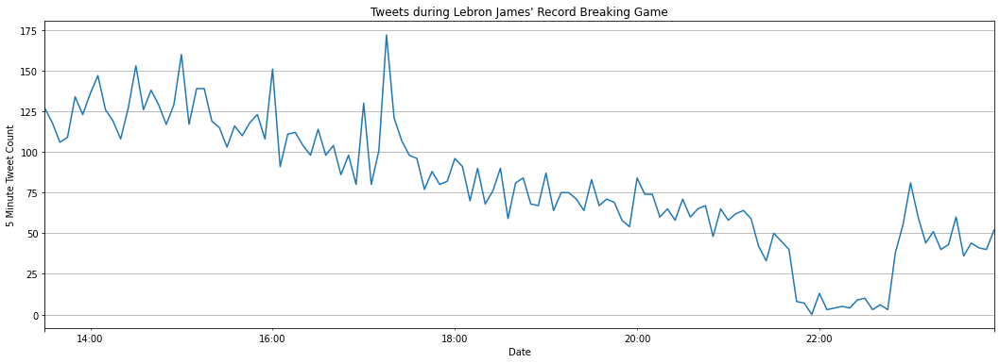

In [ ]:
tweet_df_5min = df.groupby(pd.Grouper(key='Date', freq='5Min', convention='start')).size()
tweet_df_5min.plot(figsize=(18,6))
plt.ylabel('5 Minute Tweet Count')
plt.title("Tweets during Lebron James' Record Breaking Game")
plt.grid(True)

In [ ]:
# Look at all the tweets with Lebron James and hate
df2 = df[df['Tweet'].str.contains('hate')]

# Creating list to append tweet data to
tweets_list1 = []

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('from:kaypriceee lebron').get_items()):
    if i>100:
        break
    tweets_list1.append([tweet.date, tweet.id, tweet.content, tweet.user.username])

# Creating a dataframe from the tweets list above
tweets_df1 = pd.DataFrame(tweets_list1, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweet1 = tweets_df1.sort_values(by=['Datetime'])
tweet1.head(5)


In [ ]:
# Creating list to append tweet data to
tweets_list2 = []

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('from:CompaNaturaleza lebron').get_items()):
    if i>100:
        break
    tweets_list2.append([tweet.date, tweet.id, tweet.content, tweet.user.username])

# Creating a dataframe from the tweets list above
tweets_df2 = pd.DataFrame(tweets_list2, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweet2 = tweets_df2.sort_values(by=['Datetime'])
tweet2.head(5)

<ipython-input-32-1cec066042d8>:8: FutureWarning: content is deprecated, use rawContent instead
  tweets_list2.append([tweet.date, tweet.id, tweet.content, tweet.user.username])


,Datetime,Tweet Id,Text,Username
53,2013-12-25 23:29:45+00:00,415987758855757824,ESPN is like let's just completely end the sea...,CompaNaturaleza
52,2014-01-10 18:27:06+00:00,421709800490037248,@LakersNation some of these trade proposals li...,CompaNaturaleza
51,2015-06-05 01:15:41+00:00,606630437595643904,Lebron is nervous to fail his city. That's why...,CompaNaturaleza
50,2015-06-08 02:38:34+00:00,607738459927609345,Lebron James,CompaNaturaleza
49,2015-06-17 03:52:05+00:00,611018448894754818,Lebron need to get that MVP though,CompaNaturaleza


In [ ]:
hater = list(tweet1["Text"])

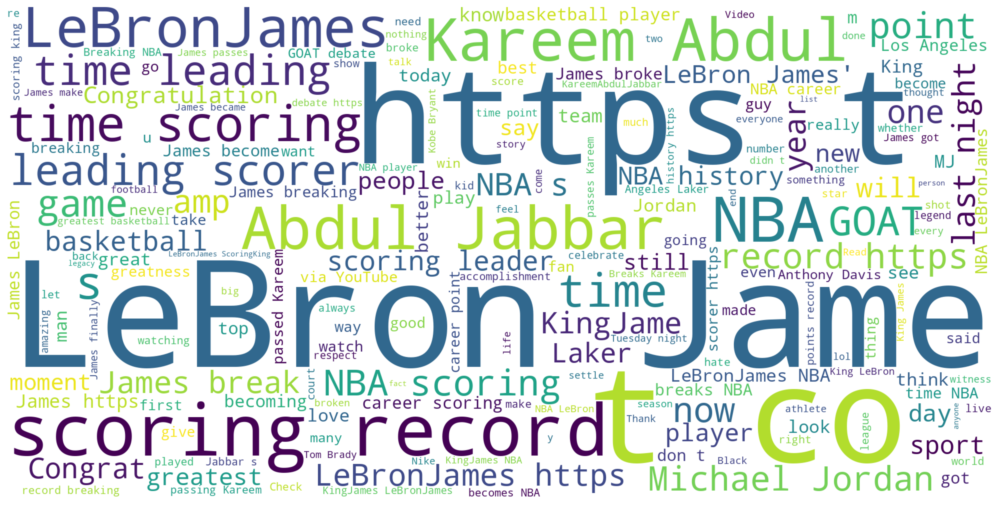

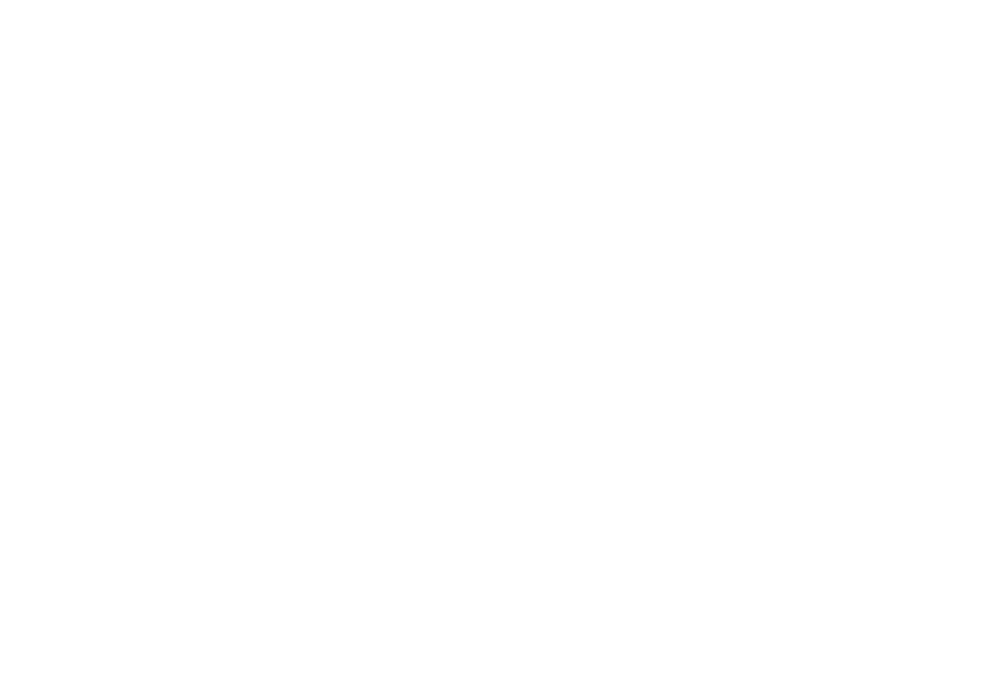

<Figure size 432x288 with 0 Axes>

In [ ]:
exclude_words = {'https', 'LeBron Jame','Lebron James','lebron james','lebron','james','Lebron','James'}
 
new_words = [i for i in tweets if i not in exclude_words]
 
#print(new_players)

wordcloud = WordCloud(width=2000, height=1000, background_color='white', max_font_size=2500).generate(' '.join(new_words))

#displayed using matplot(not really working In Google environment atleast the word cloud wasn't)
plt.figure(figsize=(15, 15), dpi=600)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()
#saved results as image first
plt.savefig('wordcloud.png', dpi=800, bbox_inches='tight')
#plt.savefig('wordcloud.pdf', bbox_inches='tight')
#Here I am displaying the saved image. This was the only wayy I could actually get it to show up
Image(filename='wordcloud.png')